<div class="alert alert-success">
<h3> Will be transated...</h3>

</div>

## Создание прототипа модели машинного обучения по оптимизации производства золота для компании «Цифра».
---
Проект содержит анализ данных о концентрации металлов на разных стадиях добычи и очистки руды. Модель машинного обучения построена для прогнозирования количества золота, извлеченного из золотосодержащей руды, для повышения эффективности деятельности компании и оптимизации производства.

---
<a id='the_contents'></a>

##### Часть 1. Подготовка данных.
* [1.1 Подготовительные операции и анализ данных.](#the_part_1.1)
* [1.2 Проверка корректности расчета коэффициента восстановления золота.](#the_part_1.2)
* [1.3 Анализ признаков, недоступных в тестовой выборке.](#the_part_1.3)
* [1.4 Предобработка данных.](#the_part_1.4)

##### Часть 2. Анализ данных.
* [2.1 Анализ концентрации металлов (Au, Ag, Pb) на различных этапах очистки.](#the_part_2.1)
* [2.2 Сравнение распределения размеров гранул сырья на обучающей и тестовой выборках.](#the_part_2.2)
* [2.3 Исследование суммарной концентрации всех веществ на разных стадиях.](#the_part_2.3)

##### Часть 3. Модель.
* [3.1. Построение функции для вычисления итоговой sMAPE.](#the_part_3.1)
* [3.2. Обучение модей и оценка их качества.](#the_part_3.2)

##### Часть 4. Заключение.
* [Выводы по исследованию.](#the_part_4)

---

# 1. Подготовка данных

<a id='the_part_1.1'></a>
### 1.1 Подготовительные операции и анализ данных.

In [1]:
# Импортируем необходимые библиотеки
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model as lm
from sklearn.metrics import mean_squared_error, make_scorer, accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import f_regression, mutual_info_regression

In [2]:
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

In [3]:
# Загружаем файл данных
try:
    df_tn = pd.read_csv('https://C:/datasets/gold_recovery_train.csv')
    df_tt = pd.read_csv('https://C:/datasets/gold_recovery_test.csv')
    df_fl = pd.read_csv('https://C:/datasets/gold_recovery_full.csv')
except:
    df_tn = pd.read_csv(r'D:\Docs\Documents\ЯПрактикум\Сборный проект-2\gold_recovery_train.csv')
    df_tt = pd.read_csv(r'D:\Docs\Documents\ЯПрактикум\Сборный проект-2\gold_recovery_test.csv')
    df_fl = pd.read_csv(r'D:\Docs\Documents\ЯПрактикум\Сборный проект-2\gold_recovery_full.csv')

In [4]:
# Общая информация
dfs = [df_tn, df_tt, df_fl]

for i in range(len(dfs)):
    display(dfs[i].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
date                                                  16860 non-null object
final.output.concentrate_ag                           16788 non-null float64
final.output.concentrate_pb                           16788 non-null float64
final.output.concentrate_sol                          16490 non-null float64
final.output.concentrate_au                           16789 non-null float64
final.output.recovery                                 15339 non-null float64
final.output.tail_ag                                  16794 non-null float64
final.output.tail_pb                                  16677 non-null float64
final.output.tail_sol                                 16715 non-null float64
final.output.tail_au                                  16794 non-null float64
primary_cleaner.input.sulfate                         15553 non-null float64
primary_cleaner.input.depressant             

None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
date                                          5856 non-null object
primary_cleaner.input.sulfate                 5554 non-null float64
primary_cleaner.input.depressant              5572 non-null float64
primary_cleaner.input.feed_size               5856 non-null float64
primary_cleaner.input.xanthate                5690 non-null float64
primary_cleaner.state.floatbank8_a_air        5840 non-null float64
primary_cleaner.state.floatbank8_a_level      5840 non-null float64
primary_cleaner.state.floatbank8_b_air        5840 non-null float64
primary_cleaner.state.floatbank8_b_level      5840 non-null float64
primary_cleaner.state.floatbank8_c_air        5840 non-null float64
primary_cleaner.state.floatbank8_c_level      5840 non-null float64
primary_cleaner.state.floatbank8_d_air        5840 non-null float64
primary_cleaner.state.floatbank8_d_level      5840 non-null float64
rougher.in

None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22716 entries, 0 to 22715
Data columns (total 87 columns):
date                                                  22716 non-null object
final.output.concentrate_ag                           22627 non-null float64
final.output.concentrate_pb                           22629 non-null float64
final.output.concentrate_sol                          22331 non-null float64
final.output.concentrate_au                           22630 non-null float64
final.output.recovery                                 20753 non-null float64
final.output.tail_ag                                  22633 non-null float64
final.output.tail_pb                                  22516 non-null float64
final.output.tail_sol                                 22445 non-null float64
final.output.tail_au                                  22635 non-null float64
primary_cleaner.input.sulfate                         21107 non-null float64
primary_cleaner.input.depressant             

None

In [5]:
# Посмотрим на датасет
for i in range(len(dfs)):
    display(dfs[i].tail(2))

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
16858,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471
16859,2018-08-18 10:59:59,3.598375,11.737832,6.717509,46.299438,70.281454,8.406690,2.517518,10.652193,1.389434,...,23.018622,-500.492702,20.020205,-500.220296,17.963512,-499.939490,12.990306,-500.080993,19.990336,-499.191575


,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
5854,2017-12-31 22:59:59,179.697158,15.438979,8.07,1.501068,1498.466243,-500.483984,1497.986986,-519.200340,1496.569047,...,19.958760,-499.958750,15.026853,-499.723143,11.011607,-499.985046,9.009783,-499.937902,9.012660,-500.154284
5855,2017-12-31 23:59:59,181.556856,14.995850,8.07,1.623454,1498.096303,-499.796922,1501.743791,-505.146931,1499.535978,...,20.034715,-500.728588,14.914199,-499.948518,10.986607,-500.658027,8.989497,-500.337588,8.988632,-500.764937


,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
22714,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471
22715,2018-08-18 10:59:59,3.598375,11.737832,6.717509,46.299438,70.281454,8.406690,2.517518,10.652193,1.389434,...,23.018622,-500.492702,20.020205,-500.220296,17.963512,-499.939490,12.990306,-500.080993,19.990336,-499.191575


In [6]:
# Общая статистика по числовым данным
for i in range(len(dfs)):
    display(dfs[i].describe().T)

,count,mean,std,min,25%,50%,75%,max
final.output.concentrate_ag,16788.0,4.716907,2.096718,0.000000,3.971262,4.869346,5.821176,16.001945
final.output.concentrate_pb,16788.0,9.113559,3.389495,0.000000,8.825748,10.065316,11.054809,17.031899
final.output.concentrate_sol,16490.0,8.301123,3.825760,0.000000,6.939185,8.557228,10.289741,18.124851
final.output.concentrate_au,16789.0,39.467217,13.917227,0.000000,42.055722,44.498874,45.976222,53.611374
final.output.recovery,15339.0,67.213166,11.960446,0.000000,62.625685,67.644601,72.824595,100.000000
...,...,...,...,...,...,...,...,...
secondary_cleaner.state.floatbank5_a_level,16775.0,-500.230146,76.983542,-799.741097,-500.530594,-499.784231,-496.531781,-275.073125
secondary_cleaner.state.floatbank5_b_air,16775.0,12.377241,6.219989,0.427084,8.925586,11.092839,15.979467,39.846228
secondary_cleaner.state.floatbank5_b_level,16776.0,-498.956257,82.146207,-800.258209,-500.147603,-499.933330,-498.418000,-120.190931
secondary_cleaner.state.floatbank6_a_air,16757.0,18.429208,6.958294,0.024270,13.977626,18.034960,24.984992,54.876806


,count,mean,std,min,25%,50%,75%,max
primary_cleaner.input.sulfate,5554.0,170.515243,49.608602,0.000103,143.340022,176.103893,207.240761,274.409626
primary_cleaner.input.depressant,5572.0,8.482873,3.353105,0.000031,6.411500,8.023252,10.017725,40.024582
primary_cleaner.input.feed_size,5856.0,7.264651,0.611526,5.650000,6.885625,7.259333,7.650000,15.500000
primary_cleaner.input.xanthate,5690.0,1.321420,0.693246,0.000003,0.888769,1.183362,1.763797,5.433169
primary_cleaner.state.floatbank8_a_air,5840.0,1481.990241,310.453166,0.000000,1497.190681,1554.659783,1601.681656,2212.432090
primary_cleaner.state.floatbank8_a_level,5840.0,-509.057796,61.339256,-799.773788,-500.455211,-499.997402,-499.575313,-57.195404
primary_cleaner.state.floatbank8_b_air,5840.0,1486.908670,313.224286,0.000000,1497.150234,1553.268084,1601.784707,1975.147923
primary_cleaner.state.floatbank8_b_level,5840.0,-511.743956,67.139074,-800.029078,-500.936639,-500.066588,-499.323361,-142.527229
primary_cleaner.state.floatbank8_c_air,5840.0,1468.495216,309.980748,0.000000,1437.050321,1546.160672,1600.785573,1715.053773
primary_cleaner.state.floatbank8_c_level,5840.0,-509.741212,62.671873,-799.995127,-501.300441,-500.079537,-499.009545,-150.937035


,count,mean,std,min,25%,50%,75%,max
final.output.concentrate_ag,22627.0,4.781559,2.030128,0.000000,4.018525,4.953729,5.862593,16.001945
final.output.concentrate_pb,22629.0,9.095308,3.230797,0.000000,8.750171,9.914519,10.929839,17.031899
final.output.concentrate_sol,22331.0,8.640317,3.785035,0.000000,7.116799,8.908792,10.705824,19.615720
final.output.concentrate_au,22630.0,40.001172,13.398062,0.000000,42.383721,44.653436,46.111999,53.611374
final.output.recovery,20753.0,67.447488,11.616034,0.000000,63.282393,68.322258,72.950836,100.000000
...,...,...,...,...,...,...,...,...
secondary_cleaner.state.floatbank5_a_level,22615.0,-503.323288,72.925589,-799.741097,-500.628697,-499.865158,-498.489381,-244.483566
secondary_cleaner.state.floatbank5_b_air,22615.0,11.626743,5.757449,0.427084,8.037533,10.989756,14.001193,39.846228
secondary_cleaner.state.floatbank5_b_level,22616.0,-500.521502,78.956292,-800.258209,-500.167897,-499.951980,-499.492354,-120.190931
secondary_cleaner.state.floatbank6_a_air,22597.0,17.976810,6.636203,-0.079426,13.968418,18.004215,23.009704,54.876806


In [7]:
# Смотрим начало обучающей выборки
display(df_tn.describe().T.head(50))

,count,mean,std,min,25%,50%,75%,max
final.output.concentrate_ag,16788.0,4.716907,2.096718e+00,0.000000e+00,3.971262,4.869346,5.821176,1.600195e+01
final.output.concentrate_pb,16788.0,9.113559,3.389495e+00,0.000000e+00,8.825748,10.065316,11.054809,1.703190e+01
final.output.concentrate_sol,16490.0,8.301123,3.825760e+00,0.000000e+00,6.939185,8.557228,10.289741,1.812485e+01
final.output.concentrate_au,16789.0,39.467217,1.391723e+01,0.000000e+00,42.055722,44.498874,45.976222,5.361137e+01
final.output.recovery,15339.0,67.213166,1.196045e+01,0.000000e+00,62.625685,67.644601,72.824595,1.000000e+02
final.output.tail_ag,16794.0,8.757048,3.634103e+00,0.000000e+00,7.610544,9.220393,10.971110,1.955215e+01
final.output.tail_pb,16677.0,2.360327,1.215576e+00,0.000000e+00,1.641604,2.453690,3.192404,6.086532e+00
final.output.tail_sol,16715.0,9.303932,4.263208e+00,0.000000e+00,7.870275,10.021968,11.648573,2.231773e+01
final.output.tail_au,16794.0,2.687512,1.272757e+00,0.000000e+00,2.172953,2.781132,3.416936,9.789625e+00
primary_cleaner.input.sulfate,15553.0,129.479789,4.538693e+01,2.567664e-06,103.064021,131.783108,159.539839,2.519999e+02


In [8]:
# Смотрим конец обучающей выборки
display(df_tn.describe().T.tail(36))

,count,mean,std,min,25%,50%,75%,max
rougher.output.tail_sol,14611.0,17.865309,3.455588,10.014648,15.646980,17.996971,19.933255,66.117188
rougher.output.tail_au,14611.0,1.763930,0.731518,0.020676,1.311610,1.747907,2.190839,9.688980
rougher.state.floatbank10_a_air,16807.0,1077.201302,291.800894,-0.345168,999.636979,1001.310190,1299.577654,1521.980372
rougher.state.floatbank10_a_level,16807.0,-384.109359,112.408685,-658.223080,-499.908427,-300.233403,-299.976784,-19.383282
rougher.state.floatbank10_b_air,16807.0,1252.285954,331.076715,-0.759568,1196.415722,1299.649429,1432.326657,1809.194008
rougher.state.floatbank10_b_level,16807.0,-475.443395,70.051458,-650.437575,-500.284895,-499.837368,-400.865979,9.457822
rougher.state.floatbank10_c_air,16807.0,1229.567445,344.840251,-0.378521,1100.084257,1298.324087,1448.560325,2499.129174
rougher.state.floatbank10_c_level,16814.0,-474.713811,67.065122,-650.151190,-500.329171,-499.775884,-401.277897,-10.242658
rougher.state.floatbank10_d_air,16802.0,1146.785992,327.311834,-1.197435,1044.848978,1199.211289,1307.829439,2077.222699
rougher.state.floatbank10_d_level,16809.0,-476.180417,64.118377,-649.300693,-500.594910,-499.640478,-402.354963,21.365035


In [9]:
# Определим функцию анализа пропущенных данных
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total missing data', 'Percent missing data'])

In [10]:
# Выполним поиск пропущенных данных
for i in range(len(dfs)):
    display(missing_data(dfs[i]))

,Total missing data,Percent missing data
rougher.output.recovery,2573,15.260973
rougher.output.tail_ag,2250,13.345196
rougher.output.tail_sol,2249,13.339265
rougher.output.tail_au,2249,13.339265
secondary_cleaner.output.tail_sol,1986,11.779359
...,...,...
rougher.calculation.sulfate_to_au_concentrate,27,0.160142
rougher.calculation.floatbank10_sulfate_to_au_feed,27,0.160142
rougher.calculation.floatbank11_sulfate_to_au_feed,27,0.160142
primary_cleaner.input.feed_size,0,0.000000


,Total missing data,Percent missing data
rougher.input.floatbank11_xanthate,353,6.028005
primary_cleaner.input.sulfate,302,5.157104
primary_cleaner.input.depressant,284,4.849727
rougher.input.floatbank10_sulfate,257,4.388661
primary_cleaner.input.xanthate,166,2.834699
rougher.input.floatbank10_xanthate,123,2.100410
rougher.input.feed_sol,67,1.144126
rougher.input.floatbank11_sulfate,55,0.939208
rougher.input.feed_rate,40,0.683060
secondary_cleaner.state.floatbank3_a_air,34,0.580601


,Total missing data,Percent missing data
rougher.output.recovery,3119,13.730410
rougher.output.tail_ag,2737,12.048776
rougher.output.tail_sol,2736,12.044374
rougher.output.tail_au,2736,12.044374
rougher.input.floatbank11_xanthate,2257,9.935728
...,...,...
primary_cleaner.state.floatbank8_b_level,43,0.189294
primary_cleaner.state.floatbank8_c_level,43,0.189294
primary_cleaner.state.floatbank8_d_level,43,0.189294
primary_cleaner.input.feed_size,0,0.000000


In [11]:
# Поиск дубликатов
print('Дубликаты \nTrain:', df_tn.duplicated().sum(), 
      '\n Test:', df_tt.duplicated().sum(),
      '\n Full:', df_fl.duplicated().sum()) 

Дубликаты 
Train: 0 
 Test: 0 
 Full: 0


### Вывод
- Данные имеют пропущенные значения
- Дубликатов нет

<a id='the_part_1.2'></a>
### 1.2 Проверка корректности расчета коэффициента восстановления золота.

In [12]:
# Сохранение параметров в переменных
recovery = df_tn['rougher.output.recovery']
c = df_tn['rougher.output.concentrate_au']
f = df_tn['rougher.input.feed_au']
t = df_tn['rougher.output.tail_au']

# Расчет по формуле
recovery_calc = 100*c*(f-t)/(f*(c-t))
mae_recovery = abs(recovery_calc-recovery).sum()/len(recovery)

# Вывод
display(mae_recovery)

9.567251432893188e-15

### Вывод
- Ошибка 9,5e-15 очень мала. Коэффициент восстановления рассчитан верно.

<a id='the_part_1.3'></a>
### 1.3 Анализ признаков, недоступных в тестовой выборке.

In [13]:
# Вывод списка разичающихся в тестовой и обучающей выбрках столбцов
df_tn.columns.difference(df_tt.columns)

Index(['final.output.concentrate_ag', 'final.output.concentrate_au',
       'final.output.concentrate_pb', 'final.output.concentrate_sol',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_au',
       'final.output.tail_pb', 'final.output.tail_sol',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_au',
       'primary_cleaner.output.tail_pb', 'primary_cleaner.output.tail_sol',
       'rougher.calculation.au_pb_ratio',
       'rougher.calculation.floatbank10_sulfate_to_au_feed',
       'rougher.calculation.floatbank11_sulfate_to_au_feed',
       'rougher.calculation.sulfate_to_au_concentrate',
       'rougher.output.concentrate_ag', 'rougher.output.concentrate_au',
       'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol',
       'roughe

### Вывод
- Столбцы содержат выходные и расчетные параметры. Они не нужны для построения модели машинного обучения.

<a id='the_part_1.4'></a>
### 1.4 Предобработка данных.

In [14]:
# Заполним пропущенные значения
df_tn = df_tn.fillna(method = 'ffill')
df_tt = df_tt.fillna(method = 'ffill')
df_fl = df_fl.fillna(method = 'ffill')

In [15]:
# Выполним поиск пропущенных данных
display(missing_data(df_tn))
display(missing_data(df_tt))
display(missing_data(df_fl))

,Total missing data,Percent missing data
secondary_cleaner.state.floatbank6_a_level,0,0.0
rougher.calculation.floatbank10_sulfate_to_au_feed,0,0.0
primary_cleaner.state.floatbank8_a_level,0,0.0
primary_cleaner.state.floatbank8_b_air,0,0.0
primary_cleaner.state.floatbank8_b_level,0,0.0
...,...,...
rougher.state.floatbank10_d_air,0,0.0
rougher.state.floatbank10_d_level,0,0.0
rougher.state.floatbank10_e_air,0,0.0
rougher.state.floatbank10_e_level,0,0.0


,Total missing data,Percent missing data
secondary_cleaner.state.floatbank6_a_level,0,0.0
rougher.state.floatbank10_b_air,0,0.0
rougher.state.floatbank10_a_air,0,0.0
rougher.input.floatbank11_xanthate,0,0.0
rougher.input.floatbank11_sulfate,0,0.0
rougher.input.floatbank10_xanthate,0,0.0
rougher.input.floatbank10_sulfate,0,0.0
rougher.input.feed_au,0,0.0
rougher.input.feed_sol,0,0.0
rougher.input.feed_size,0,0.0


,Total missing data,Percent missing data
secondary_cleaner.state.floatbank6_a_level,0,0.0
rougher.calculation.floatbank10_sulfate_to_au_feed,0,0.0
primary_cleaner.state.floatbank8_a_level,0,0.0
primary_cleaner.state.floatbank8_b_air,0,0.0
primary_cleaner.state.floatbank8_b_level,0,0.0
...,...,...
rougher.state.floatbank10_d_air,0,0.0
rougher.state.floatbank10_d_level,0,0.0
rougher.state.floatbank10_e_air,0,0.0
rougher.state.floatbank10_e_level,0,0.0


### Вывод
- Пропущенные значения заполнили с использованием параметра `ffill`, поскольку соседние по времени параметры часто похожи.

[<span style="color:green"> Возврат к оглавлению</span>](#the_contents)

# 2. Анализ данных

<a id='the_part_2.1'></a>
### 2.1 Анализ концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

In [16]:
# Концентрация золота на разных этапах очистки
au_stages = df_fl[['rougher.input.feed_au', 'rougher.output.concentrate_au', 'primary_cleaner.output.concentrate_au',
                  'final.output.concentrate_au']]

# Концентрация серебра на разных этапах очистки
ag_stages = df_fl[['rougher.input.feed_ag', 'rougher.output.concentrate_ag', 'primary_cleaner.output.concentrate_ag',
                  'final.output.concentrate_ag']]

# Концентрация свинца на разных этапах очистки
pb_stages = df_fl[['rougher.input.feed_pb', 'rougher.output.concentrate_pb', 'primary_cleaner.output.concentrate_pb',
                  'final.output.concentrate_pb']]

In [17]:
# График распределения концентрации золота на разных стадиях
fig = go.Figure()
for column in list(au_stages):
    fig.add_trace(go.Histogram(x=au_stages[column], name=column))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.update_layout(title_text='Концентрация золота на разных стадиях', xaxis_title_text='Концентрация %',
                  yaxis_title_text='Количество',
)
fig.show()

# График распределения концентрации серебра на разных стадиях
fig = go.Figure()
for column in list(ag_stages):
    fig.add_trace(go.Histogram(x=ag_stages[column], name=column))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.update_layout(title_text='Концентрация серебра на разных стадиях', xaxis_title_text='Концентрация %',
                  yaxis_title_text='Количество',
)
fig.show()

# График распределения концентрации свинца на разных стадиях
fig = go.Figure()
for column in list(pb_stages):
    fig.add_trace(go.Histogram(x=pb_stages[column], name=column))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.update_layout(title_text='Концентрация свинца на разных стадиях', xaxis_title_text='Концентрация %',
                  yaxis_title_text='Количество',
)
fig.show()

### Вывод
- Концентрация золота непрерывно увеличивается на каждой стадии очистки.
- Концентрация серебра сначала увеличивается, затем снижается. На последней стадии концентрация ниже, чем вначале.
- Концентрация свинца незначительно увеличивается по прохождении этапов очистки.

<a id='the_part_2.2'></a>
### 2.2 Сравнение распределения размеров гранул сырья на обучающей и тестовой выборках.

In [18]:
# График распределения гранул сырья на этапе флотации
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_tn['rougher.input.feed_size'], name='Обучающая выборка', nbinsx=100))
fig.add_trace(go.Histogram(x=df_tt['rougher.input.feed_size'], name='Тестовая выборка', nbinsx=100))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.update_layout(title_text='Распределения гранул сырья этапа флотации', xaxis_title_text='Концентрация %',
                  yaxis_title_text='Количество',
)
fig.show()

# График распределения гранул сырья на этапе первичной очистки
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_tn['primary_cleaner.input.feed_size'], name='Обучающая выборка', nbinsx=80))
fig.add_trace(go.Histogram(x=df_tt['primary_cleaner.input.feed_size'], name='Тестовая выборка', nbinsx=80))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.update_layout(title_text='Распределения гранул сырья этапа первичной очистки', xaxis_title_text='Концентрация %',
                  yaxis_title_text='Количество',
)
fig.show()

### Вывод
- Распределения частиц по размерам показывают, что размеры частиц меняются незначительно на обучающей и тестовой выборках.
- Можно расчитывать на корректную оценку модели.

<a id='the_part_2.3'></a>
### 2.3 Исследование суммарной концентрации всех веществ на разных стадиях.

In [19]:
# Функция суммы концентраций веществ исходного сырья
def total_feed(df):
    return (df['rougher.input.feed_ag'] + df['rougher.input.feed_pb'] + df['rougher.input.feed_sol'] +
            df['rougher.input.feed_au'])

# Функция суммы концентраций веществ чернового концентрата
def total_rougher(df):
    return (df['rougher.output.concentrate_ag'] + df['rougher.output.concentrate_pb'] + df['rougher.output.concentrate_sol'] +
            df['rougher.output.concentrate_au'])

# Функция суммы концентраций веществ финального концентрата
def total_final(df):
    return (df['final.output.concentrate_ag'] + df['final.output.concentrate_pb'] + df['final.output.concentrate_sol'] +
            df['final.output.concentrate_au'])

In [20]:
# Формирование столбца суммы концентраций веществ исходного сырья
df_fl['rougher.input.feed_all'] = total_feed(df_fl)

# Формирование столбца суммы концентраций веществ чернового концентрата
df_fl['rougher.output.concentrate_all'] = total_rougher(df_fl)

# Формирование столбца суммы концентраций веществ финального концентрата
df_fl['final.output.concentrate_all'] = total_final(df_fl)

# Датафрейм со всеми данными по суммарным концентрациям
all_substance = df_fl[['rougher.input.feed_all', 'rougher.output.concentrate_all', 'final.output.concentrate_all']]

In [21]:
# График распределения суммарной концентрации веществ на разных стадиях
fig = go.Figure()
for column in list(all_substance):
    fig.add_trace(go.Histogram(x=all_substance[column], name=column))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.update_layout(title_text='Распределение суммарной концентрации веществ на разных стадиях', xaxis_title_text='Концентрация %',
                  yaxis_title_text='Количество',
)
fig.show()

### Вывод
- Распределения концентраций на всех этапах имеют аномальные значения при 0 %.
- Удалим из выборок значения <5 % для повышения качества работы моделей.

[<span style="color:green"> Возврат к оглавлению</span>](#the_contents)

# 3. Модель

<a id='the_part_3.1'></a>
### 3.1 Построение функции для вычисления итоговой sMAPE.

In [22]:
# Функция для вычисления итоговой sMAPE
def smape_calc(y, y_pred):
    y_r = y.iloc[:, 0]
    y_pred_r = y_pred[:, 0]
    smape_r = 100 * np.mean(abs(y_r - y_pred_r) / ((abs(y_r) + abs(y_pred_r)) / 2))

    y_f= y.iloc[:, 1]
    y_pred_f = y_pred[:, 1]
    smape_f = 100 * np.mean(abs(y_f - y_pred_f) / ((abs(y_f) + abs(y_pred_f)) / 2))
    
    return (0.25*smape_r)  + (0.75*smape_f)

<a id='the_part_3.2'></a>
### 3.2 Обучение модей и оценка их качества.

In [23]:
# Формирование столбца суммы концентраций веществ исходного сырья 
df_tn['rougher.input.feed_all'] = total_feed(df_tn)

# Формирование столбца суммы концентраций веществ чернового концентрата
df_tn['rougher.output.concentrate_all'] = total_rougher(df_tn)

# Формирование столбца суммы концентраций веществ финального концентрата
df_tn['final.output.concentrate_all'] = total_final(df_tn)

In [24]:
# Обрезаем аномальные значения в обучающей выборке
trs = 5
df_tn = (df_tn[(df_tn['rougher.input.feed_all'] > trs) & (df_tn['rougher.output.concentrate_all'] > trs) & 
               (df_tn['final.output.concentrate_all'] > trs)])
df_tn = df_tn.drop(['rougher.input.feed_all', 'rougher.output.concentrate_all', 'final.output.concentrate_all'], axis=1)

In [25]:
# Формируем датафрейм столбцов для добавления в тестовую выборку
df_fl_totest = df_fl[['date', 'rougher.output.recovery', 'final.output.recovery',  
'rougher.output.concentrate_ag', 'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol', 'rougher.output.concentrate_au',
'final.output.concentrate_ag', 'final.output.concentrate_pb', 'final.output.concentrate_sol', 'final.output.concentrate_au']]

In [26]:
# Добавляем столбцы в тестовую выборку
df_tt = df_tt.merge(df_fl_totest, on='date', how='left')

In [27]:
# Формирование столбца суммы концентраций веществ исходного сырья 
df_tt['rougher.input.feed_all'] = total_feed(df_tt)

# Формирование столбца суммы концентраций веществ чернового концентрата
df_tt['rougher.output.concentrate_all'] = total_rougher(df_tt)

# Формирование столбца суммы концентраций веществ финального концентрата
df_tt['final.output.concentrate_all'] = total_final(df_tt)

In [28]:
# Обрезаем аномальные значения в тестовой выборке
df_tt = (df_tt[(df_tt['rougher.input.feed_all'] > trs) & (df_tt['rougher.output.concentrate_all'] > trs) & 
               (df_tt['final.output.concentrate_all'] > trs)])
df_tt = df_tt.drop(['rougher.input.feed_all', 'rougher.output.concentrate_all', 'final.output.concentrate_all'], axis=1)

In [29]:
# Убираем лишнее из тестовой выборки
df_fl_totest = df_fl_totest.drop(['date', 'rougher.output.recovery', 'final.output.recovery'], axis=1)
df_tt = df_tt.drop(list(df_fl_totest.columns.values), axis=1)

In [30]:
# Оставляем в обучающей выборке признаки из тестовой выборки
df_tn = df_tn.loc[:, list(df_tt.columns)]

In [31]:
# Убираем из выборок столбец с датами
df_tn = df_tn.drop('date', axis=1)
df_tt = df_tt.drop('date', axis=1)

In [32]:
# Разбиваем обучающую выборку на признаки и целевые признаки
features_train = df_tn.drop(columns=['rougher.output.recovery', 'final.output.recovery'], axis=1)
target_train = df_tn[['rougher.output.recovery', 'final.output.recovery']]

# Разбиваем тестовую выборку на признаки и целевые признаки
features_test = df_tt.drop(columns=['rougher.output.recovery', 'final.output.recovery'], axis=1)
target_test = df_tt[['rougher.output.recovery', 'final.output.recovery']]

# target_test = df_fl[['rougher.output.recovery', 'final.output.recovery']].loc[df_tt.index].reset_index(drop=True)

In [33]:
# Применим f_regression с целевым признаком rougher.output.recovery
f_test, _ = f_regression(features_train, target_train.iloc[:, 0])
f_test /= np.max(f_test)

# Применим mutual_info_regression с целевым признаком rougher.output.recovery
mi = mutual_info_regression(features_train, target_train.iloc[:, 0])
mi /= np.max(mi)

<BarContainer object of 52 artists>

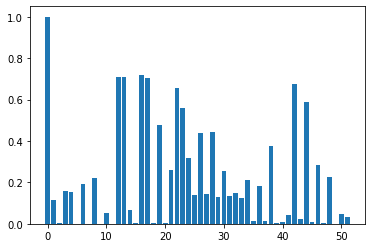

In [34]:
# Построим график значения f_test призаков
plt.bar(range(len(f_test)), f_test)

<BarContainer object of 52 artists>

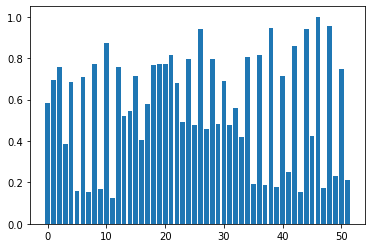

In [35]:
# Построим график значения mutual information призаков
plt.bar(range(len(mi)), mi)

In [36]:
# Применим f_regression с целевым признаком final.output.recovery
f_test2, _ = f_regression(features_train, target_train.iloc[:, 1])
f_test2 /= np.max(f_test2)

# Применим mutual_info_regression с целевым признаком final.output.recovery
mi2 = mutual_info_regression(features_train, target_train.iloc[:, 1])
mi2 /= np.max(mi2)

<BarContainer object of 52 artists>

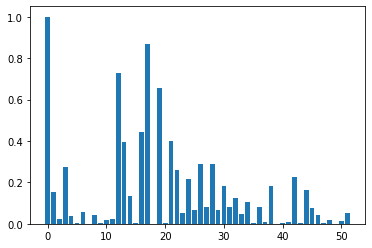

In [37]:
# Построим график значения f_test призаков
plt.bar(range(len(f_test2)), f_test2)

<BarContainer object of 52 artists>

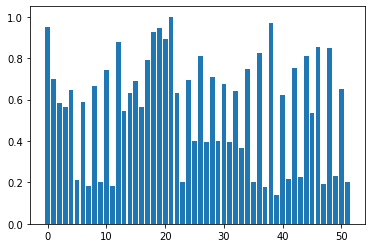

In [38]:
# Построим график значения mutual information призаков
plt.bar(range(len(mi2)), mi2)

In [39]:
# Границы для f_test и mutual information
trs_f = 0.5
trs_mi = 0.3

# Оставляем только признаки с показателями, превышающими trs_f и trs_mi
features_train = features_train.loc[:, (f_test > trs_f) & (mi > trs_mi)]
features_test = features_test.loc[:, (f_test > trs_f) & (mi > trs_mi)]

In [40]:
# Посмотрим на количество оставшихся признаков
features_train.shape

(14584, 9)

In [41]:
# Посмотрим на взаимную корреляцию признаков
features_train.corr()

,primary_cleaner.input.sulfate,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_b_air
primary_cleaner.input.sulfate,1.000000,0.545661,0.562767,0.383824,0.614361,0.198516,0.102336,0.073440,0.093491
rougher.input.feed_ag,0.545661,1.000000,0.539377,0.109302,0.852163,0.297974,-0.014302,0.062762,0.092035
rougher.input.feed_pb,0.562767,0.539377,1.000000,0.082387,0.726066,0.232027,0.290142,0.168467,0.223800
rougher.input.feed_sol,0.383824,0.109302,0.082387,1.000000,0.080909,0.221802,0.284555,0.266606,0.163750
rougher.input.feed_au,0.614361,0.852163,0.726066,0.080909,1.000000,0.209623,0.002040,-0.004939,0.054445
rougher.state.floatbank10_a_air,0.198516,0.297974,0.232027,0.221802,0.209623,1.000000,0.579527,0.572690,0.555671
rougher.state.floatbank10_a_level,0.102336,-0.014302,0.290142,0.284555,0.002040,0.579527,1.000000,0.616925,0.522679
secondary_cleaner.state.floatbank4_a_air,0.073440,0.062762,0.168467,0.266606,-0.004939,0.572690,0.616925,1.000000,0.841145
secondary_cleaner.state.floatbank4_b_air,0.093491,0.092035,0.223800,0.163750,0.054445,0.555671,0.522679,0.841145,1.000000


In [42]:
# Посмотрим на результат разбиения
# display(features_test)
# display(features_train)
display(target_test)
display(target_train)

,rougher.output.recovery,final.output.recovery
0,89.993421,70.273583
1,88.089657,68.910432
2,88.412756,68.143213
3,87.360133,67.776393
4,83.236367,61.467078
...,...,...
5851,95.172585,68.919891
5852,94.575036,68.440582
5853,93.018138,67.092759
5854,92.599042,68.061186


,rougher.output.recovery,final.output.recovery
0,87.107763,70.541216
1,86.843261,69.266198
2,86.842308,68.116445
3,87.226430,68.347543
4,86.688794,66.927016
...,...,...
16855,89.574376,73.755150
16856,87.724007,69.049291
16857,88.890579,67.002189
16858,89.858126,65.523246


In [43]:
# Не обязательная для выборок данного проекта операция стандартизации
scaler = StandardScaler()
scaler.fit(features_train)
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

In [44]:
# Создаем генератор псевдослучайных чисел
rstate = np.random.RandomState(123)

In [45]:
# Создаем scorer
scoring_smape = make_scorer(smape_calc, greater_is_better=False)

In [46]:
# Построение модели решающего дерева
model_dtr = DecisionTreeRegressor(random_state=rstate)
param_grid={'max_depth': range(2, 23, 2)}
gs = GridSearchCV(model_dtr, param_grid, scoring=scoring_smape, cv=4)
gs.fit(features_train, target_train)
print('Лучшие параметры:', gs.best_params_)
print('Параметры:', gs.cv_results_['params'])
print('Результаты:', abs(gs.cv_results_['mean_test_score']))

Лучшие параметры: {'max_depth': 4}
Параметры: [{'max_depth': 2}, {'max_depth': 4}, {'max_depth': 6}, {'max_depth': 8}, {'max_depth': 10}, {'max_depth': 12}, {'max_depth': 14}, {'max_depth': 16}, {'max_depth': 18}, {'max_depth': 20}, {'max_depth': 22}]
Результаты: [10.50217122 10.29355079 11.01392239 11.42837085 12.27001627 13.07367997
 14.13640973 16.39233238 15.41644222 16.92747024 14.84424799]


In [47]:
# Построение модели случайного леса
model_rfr = RandomForestRegressor(random_state=rstate)
param_grid={'n_estimators': range(10, 161, 30), 'max_depth': range(10, 91, 20)}
gs = GridSearchCV(model_rfr, param_grid, scoring=scoring_smape, cv=4)
gs.fit(features_train, target_train)
display(gs.best_params_)
display(gs.cv_results_['params'], abs(gs.cv_results_['mean_test_score']))

{'max_depth': 10, 'n_estimators': 70}

[{'max_depth': 10, 'n_estimators': 10},
 {'max_depth': 10, 'n_estimators': 40},
 {'max_depth': 10, 'n_estimators': 70},
 {'max_depth': 10, 'n_estimators': 100},
 {'max_depth': 10, 'n_estimators': 130},
 {'max_depth': 10, 'n_estimators': 160},
 {'max_depth': 30, 'n_estimators': 10},
 {'max_depth': 30, 'n_estimators': 40},
 {'max_depth': 30, 'n_estimators': 70},
 {'max_depth': 30, 'n_estimators': 100},
 {'max_depth': 30, 'n_estimators': 130},
 {'max_depth': 30, 'n_estimators': 160},
 {'max_depth': 50, 'n_estimators': 10},
 {'max_depth': 50, 'n_estimators': 40},
 {'max_depth': 50, 'n_estimators': 70},
 {'max_depth': 50, 'n_estimators': 100},
 {'max_depth': 50, 'n_estimators': 130},
 {'max_depth': 50, 'n_estimators': 160},
 {'max_depth': 70, 'n_estimators': 10},
 {'max_depth': 70, 'n_estimators': 40},
 {'max_depth': 70, 'n_estimators': 70},
 {'max_depth': 70, 'n_estimators': 100},
 {'max_depth': 70, 'n_estimators': 130},
 {'max_depth': 70, 'n_estimators': 160},
 {'max_depth': 90, 'n_estima

array([10.36758547,  9.92038979,  9.89290997,  9.91698854,  9.90763147,
        9.9089097 , 11.06481854, 10.37311983, 10.31884303, 10.27490602,
       10.24014641, 10.21247359, 11.11181804, 10.35799317, 10.31935824,
       10.31573323, 10.27941077, 10.25930739, 11.11181804, 10.35799317,
       10.31935824, 10.31573323, 10.27941077, 10.25883023, 11.11181804,
       10.35799317, 10.31935824, 10.31573323, 10.27941077, 10.25883023])

In [48]:
# Построение модели линейной регрессии
model_lnr = LinearRegression()
model_lnr.fit(features_train, target_train)
final_smape = abs(np.mean(cross_validate(model_lnr, features_train, target_train, scoring=scoring_smape)['test_score']))
print('sMAPE линейной регрессии', ':', final_smape)

sMAPE линейной регрессии : 10.280871084930757


In [49]:
# Проверка модели случайного леса на тестовой выборке
model_rfr = RandomForestRegressor(n_estimators=70, max_depth=10, random_state=rstate)
model_rfr.fit(features_train, target_train)
final_smape = abs(np.mean(cross_validate(model_rfr, features_test, target_test, scoring=scoring_smape)['test_score']))
print('sMAPE лучшей модели на тестовой выборке:', final_smape)

sMAPE лучшей модели на тестовой выборке: 7.746664438828287


In [50]:
# Формирование предсказаний константной модели как среднего значения обучающих целевых признаков
mean_tt = target_train.mean()
constant_model = pd.DataFrame(index=range(len(target_test)), columns=['rougher.output.recovery', 'final.output.recovery'])
constant_model['rougher.output.recovery'] = mean_tt[0]
constant_model['final.output.recovery'] = mean_tt[1]

In [51]:
# Вычисление sMAPE константной модели
constant_smape = smape_calc(constant_model, target_test.values)
print('sMAPE константной модели:', constant_smape)

sMAPE константной модели: 8.248341279656449


## Вывод
- Лучшая из наблюдаемых моделей - модель случайного леса с параметрами: n_setimators=70, max_depth=10.
- Итоговый sMAPE составляет 7,7 %.
- sMAPE константной модели составляет 8,2 %.

[<span style="color:green"> Возврат к оглавлению</span>](#the_contents)

# 4. Заключение

<a id='the_part_4'></a>
### Выводы по исследованию.

- Лучшая из полученных моделей - модель случайного леса с параметрами n_setimators=70 и max_depth=10 показала sMAPE 7,7 %, что немного лучше, чем sMAPE константной модели 8,2 %.

[<span style="color:green"> Возврат к оглавлению</span>](#the_contents)